In [9]:
from dicompylercore import dicomparser, dvh, dvhcalc, dose
from scipy.integrate import cumulative_trapezoid, trapezoid
import matplotlib.pyplot as plt
import numpy as np 
import matplotlib.pyplot as plt
from pydicom import dcmread
from pydicom.data import get_testdata_file
from scipy.optimize import minimize, Bounds
import scienceplots

plt.style.use("science")

dp = dicomparser.DicomParser("../CTData/RTSTruct.dcm")

# i.e. Get a dict of structure information
structures = dp.GetStructures()

In [2]:
length = 27.5*2
unit_length = length/1000

In [3]:
max_energy = 105
min_energy = 75

doses = np.array([np.genfromtxt(f'./outputs/job{i}.csv', delimiter=',')[:, -1] for i in range(min_energy,max_energy+1)])
bragg_peaks = np.array([
    unit_length*1000 - unit_length * np.argmax(doses, axis=1)
])

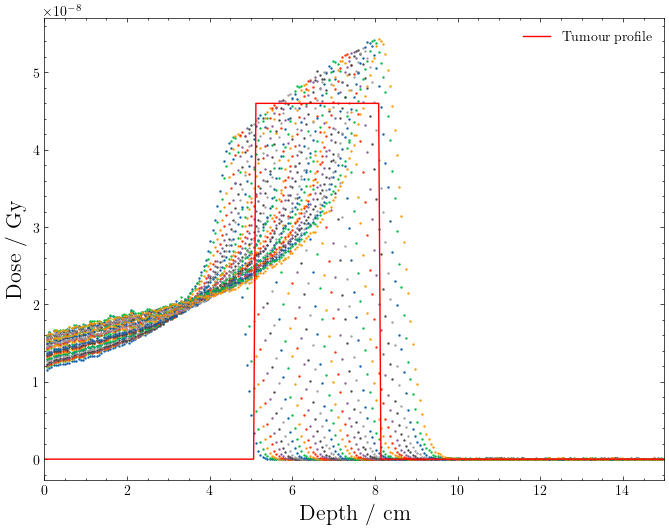

In [4]:
lower_tumour = length - np.argmax(doses[-1])*unit_length - 3
upper_tumour = length - np.argmax(doses[-1])*unit_length

def perfect_dose(i):
    if i > upper_tumour:
        return 0
    if i < lower_tumour:
        return 0
    else:
        return 4.59986147e-08

plt.figure(figsize=(8,6))
plt.plot(
    np.arange(0, (unit_length*1000), unit_length),
    [perfect_dose(i) for i in np.arange(0, (unit_length*1000), unit_length)],
    c="red",
    label="Tumour profile"
)

scaling_factors = np.max(doses, axis=1)[-1]/np.max(doses, axis=1)
for i, dose in enumerate(doses):
    plt.scatter(
        [1000*unit_length - i*unit_length for i in range(1000)],
        scaling_factors[i]**2*dose,
        s=.5
    )
plt.xlim(0,15)
plt.ylabel("Dose / Gy", fontsize=16)
plt.xlabel("Depth / cm", fontsize=16)
plt.legend()
plt.savefig("./plots/bragg_peak_collection.png", dpi=300)


In [10]:
perf_dose = np.array([perfect_dose(i) for i in np.arange(0, (unit_length*1000), unit_length)])
norm_perf_dose = perf_dose/perf_dose.max()

def f(params):
    cummulative_doses = np.sum([params[i]*dose for i, dose in enumerate(doses)], axis=0)
    
    norm_cummulative_doses=cummulative_doses/cummulative_doses.max()
    
    return np.sum((norm_cummulative_doses[::-1][int(lower_tumour/unit_length):int(upper_tumour/unit_length)] -  norm_perf_dose[int(lower_tumour/unit_length):int(upper_tumour/unit_length)])**2)

initial_guess = [0] * len(doses)  # This initializes all parameters to zero, adjust as needed

lower_bounds = [0] * len(doses)  # Lower bounds for all parameters
upper_bounds = [1] * len(doses)  # Upper bounds for all parameters

# Combine lower and upper bounds into a Bounds object
bounds = Bounds(lower_bounds, upper_bounds)

# Perform optimization
result = minimize(f, initial_guess, method='Nelder-Mead', bounds=bounds)

/var/folders/44/yjf9jwgd1bqfct8dx076vwqm0000gn/T/ipykernel_47966/1535890320.py:7: RuntimeWarning: invalid value encountered in divide
  norm_cummulative_doses=cummulative_doses/cummulative_doses.max()


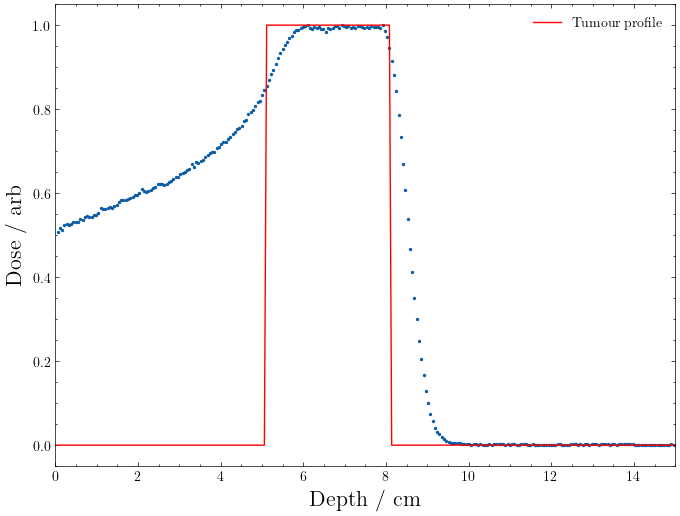

In [6]:
sf = result.x/result.x.max()

cummulative_doses = np.sum([sf[i]*dose for i, dose in enumerate(doses)], axis=0)
perf_dose = np.array([perfect_dose(i) for i in np.arange(0, (unit_length*1000), unit_length)])

plt.figure(figsize=(8,6))

plt.scatter(
    [1000*unit_length - i*unit_length for i in range(1000)],
    cummulative_doses/cummulative_doses.max(),
    s=2
)
plt.plot(
    np.arange(0, (unit_length*1000), unit_length),
    perf_dose/perf_dose.max(),
    c="red",
    label="Tumour profile"
)
plt.xlabel("Depth / cm", fontsize=16)
plt.ylabel("Dose / arb", fontsize=16)
plt.legend()
plt.xlim(0,15)
plt.savefig("./plots/bragg_peak_phantom.png", dpi=300)

In [7]:
import subprocess
import os


EXEC_PATH = "/Applications/topas/bin/topas "

os.environ["TOPAS_G4_DATA_DIR"] = "/Applications/G4Data"
os.environ["QT_QPA_PLATFORM_PLUGIN_PATH"] = "/Applications/topas/Frameworks"

def topas(filepath):
    return subprocess.run(EXEC_PATH + filepath, env=os.environ, shell=True)

def multibeam(original_fp, new_fp, beam_energies, beam_fluences, seed):
    try:
        with open(original_fp, 'r') as original:
            with open(new_fp, 'w') as new:
                new.write(original.read())
                
                new.write(f'\ni:Ts/Seed = {seed}\ns:Sc/DoseScorer/OutputFile = "./outputs/multi_beam{seed}"\n')
                for i, (beam_energy, beam_fluence) in enumerate(zip(beam_energies, beam_fluences)):
                    if i == 0:
                        new.write(f'''\n
                                    s:So/Demo/Type = "Beam"\n
                                    s:So/Demo/Component = "BeamPosition"\n
                                    s:So/Demo/BeamParticle = "proton"\n
                                    u:So/Demo/BeamEnergySpread = 1.\n
                                    s:So/Demo/BeamAngularDistribution="None"\n
                                    s:So/Demo/BeamPositionDistribution="Flat"\n
                                    s:So/Demo/BeamPositionCutoffShape = "Rectangle"\n
                                    d:So/Demo/BeamPositionCutoffX = 1.5 cm\n
                                    d:So/Demo/BeamPositionCutoffY = 0.01 cm\n
                                    d:So/Demo/BeamEnergy = {beam_energy} MeV\n
                                    i:So/Demo/NumberOfHistoriesInRun   = {beam_fluence}\n
                                    d:Ge/BeamPosition/TransZ = 0 m\n
                                    d:Ge/BeamPosition/TransX = -4.6 cm\n
                                    d:Ge/BeamPosition/TransY = -20 cm\n
                                    d:Ge/BeamPosition/RotX = 90 deg\n
                                    '''.replace("  ", ""))
                    else:
                        new.write(f'''\ns:Ge/{beam_energy}BeamComponent/Parent = "World"\ns:Ge/{beam_energy}BeamComponent/Type = "Group"\nd:Ge/{beam_energy}BeamComponent/TransX = -4.6 cm\nd:Ge/{beam_energy}BeamComponent/TransY = -20 cm\nd:Ge/{beam_energy}BeamComponent/TransZ = 0. cm\nd:Ge/{beam_energy}BeamComponent/RotX= 90 deg\ni:So/{beam_energy}Beam/NumberOfHistoriesInRun   = {beam_fluence}\n
                                s:So/{beam_energy}Beam/Type                     = "Beam"\n
                                s:So/{beam_energy}Beam/Component                = "{beam_energy}BeamComponent"\n
                                s:So/{beam_energy}Beam/BeamParticle             = "proton"\n
                                d:So/{beam_energy}Beam/BeamEnergy               = {beam_energy} MeV\n
                                u:So/{beam_energy}Beam/BeamEnergySpread         = 1.\n
                                s:So/{beam_energy}Beam/BeamAngularDistribution = "None"\n
                                s:So/{beam_energy}Beam/BeamPositionDistribution="Flat"\n
                                s:So/{beam_energy}Beam/BeamPositionCutoffShape = "Rectangle" # Rectangle or Ellipse (if Flat or Gaussian)\n
                                d:So/{beam_energy}Beam/BeamPositionCutoffX = 1.5 cm # X extent of position (if Flat or Gaussian)\n
                                d:So/{beam_energy}Beam/BeamPositionCutoffY = 0.01 cm # Y extent of position (if Flat or Gaussian)\n
                                    '''.replace("  ", ""))
    except FileNotFoundError:
        print("File not found.")
    return new_fp

In [14]:
min_energy, max_energy

(75, 105)

In [587]:
for seed in range(1, 6):
    fp = multibeam(
        original_fp="./multibeam_base.txt",
        new_fp=f"./jobs/full_multibeam_{seed}.txt",
        beam_energies=[i for i in range(max_energy,min_energy-1,-1)],
        beam_fluences=np.flip(np.round(sf*100000).astype(int)),
        seed=seed
    )
    #topas(fp)


Welcome to TOPAS, Tool for Particle Simulation (Version 3.9)
Loading parameters starting from: ./jobs/full_multibeam_1.txt

Geant4 Data directory has been specified by the
TOPAS_G4_DATA_DIR environment variable as /Applications/G4Data

**************************************************************
 Geant4 version Name: geant4-10-07-patch-03 [MT]   (19-November-2021)
  << in Multi-threaded mode >> 
                       Copyright : Geant4 Collaboration
                      References : NIM A 506 (2003), 250-303
                                 : IEEE-TNS 53 (2006), 270-278
                                 : NIM A 835 (2016), 186-225
                             WWW : http://geant4.org/
**************************************************************

TOPAS is in MT mode, setting number of threads to: 8

TOPAS set the tolerances based on the World size to:
      Surface tolerance = 0.01 nm, and radial tolerance = 0.01 nm.
TOPAS will read DICOM directory: ../CTData
    Iso Center [cm]:  

G4WT7 > 
Topas experienced an error in scoring.
G4WT7 > A scorer in the Component: "Patient"
G4WT7 > has been called for a hit in the non-parameterized volume named: "Patient/Patient_Y_Division"
G4WT7 > But this deos not make sense, as this scorer should only get called for hits
G4WT7 > in a parameterized volume (volume name would include the string "_Division").
G4WT7 > We think this may sometimes happen because Geant4 navigation gets into a corrupted state.
G4WT7 > This hit will be omitted from scoring.
G4WT7 > A note at end of session will show total number of unscored steps and the total unscored energy.
G4WT7 > In some cases the unscored energy is small enough that you can ignore this issue.
G4WT7 > This hit's energy deposit would have been: 1.26123e-32 MeV
G4WT7 > 
Topas experienced an error in scoring.
G4WT7 > A scorer in the Component: "Patient"
G4WT7 > has been called for a hit in the non-parameterized volume named: "Patient/Patient_Y_Division"
G4WT7 > But this deos not make s


TOPAS run sequence complete.
Particle source 100Beam: Total number of histories: 15968
Particle source 101Beam: Total number of histories: 1487
Particle source 102Beam: Total number of histories: 1405
Particle source 103Beam: Total number of histories: 106
Particle source 104Beam: Total number of histories: 100000
Particle source 75Beam: Total number of histories: 438
Particle source 76Beam: Total number of histories: 15
Particle source 77Beam: Total number of histories: 12
Particle source 78Beam: Total number of histories: 3
Particle source 79Beam: Total number of histories: 79
Particle source 80Beam: Total number of histories: 294
Particle source 81Beam: Total number of histories: 62
Particle source 82Beam: Total number of histories: 1569
Particle source 83Beam: Total number of histories: 2310
Particle source 84Beam: Total number of histories: 1668
Particle source 85Beam: Total number of histories: 6165
Particle source 86Beam: Total number of histories: 4988
Particle source 87Beam: 


Note that TOPAS omitted scoring one or more hits during this session because
Geant4 navigation seemed to be at the wrong level of the parameterization for this scorer.
The total number of affected hits was: 58
The total energy of affected hits was: 1.68778e-31 MeV
For details on each unscored hit, see the console log for lines starting with:
"Topas experienced a potentially serious error in scoring"
If you have only a small number of unscored hits, there is generally no cause for alarm.
If you have a large number of unscored hits, this may be due to a problem in Geant4 navigation.
You can set TOPAS to limit the number of messages about this parameterization error by setting
the parameter Ts/ParameterizationErrorMaxReports
You can set TOPAS to exit if it exceeds a given number of unscored hits by setting
the parameter Ts/ParameterizationErrorMaxCount
You can set TOPAS to exit if it exceeds a given total energy from unscored hits by setting
the parameter Ts/ParameterizationErrorMaxEnerg


Welcome to TOPAS, Tool for Particle Simulation (Version 3.9)
Loading parameters starting from: ./jobs/full_multibeam_2.txt

Geant4 Data directory has been specified by the
TOPAS_G4_DATA_DIR environment variable as /Applications/G4Data

**************************************************************
 Geant4 version Name: geant4-10-07-patch-03 [MT]   (19-November-2021)
  << in Multi-threaded mode >> 
                       Copyright : Geant4 Collaboration
                      References : NIM A 506 (2003), 250-303
                                 : IEEE-TNS 53 (2006), 270-278
                                 : NIM A 835 (2016), 186-225
                             WWW : http://geant4.org/
**************************************************************

TOPAS is in MT mode, setting number of threads to: 8

TOPAS set the tolerances based on the World size to:
      Surface tolerance = 0.01 nm, and radial tolerance = 0.01 nm.
TOPAS will read DICOM directory: ../CTData
    Iso Center [cm]:  

G4WT1 > 
Topas experienced an error in scoring.
G4WT1 > A scorer in the Component: "Patient"
G4WT1 > has been called for a hit in the non-parameterized volume named: "Patient/Patient_Y_Division"
G4WT1 > But this deos not make sense, as this scorer should only get called for hits
G4WT1 > in a parameterized volume (volume name would include the string "_Division").
G4WT1 > We think this may sometimes happen because Geant4 navigation gets into a corrupted state.
G4WT1 > This hit will be omitted from scoring.
G4WT1 > A note at end of session will show total number of unscored steps and the total unscored energy.
G4WT1 > In some cases the unscored energy is small enough that you can ignore this issue.
G4WT1 > This hit's energy deposit would have been: 4.29102e-34 MeV
G4WT1 > 
Topas experienced an error in scoring.
G4WT1 > A scorer in the Component: "Patient"
G4WT1 > has been called for a hit in the non-parameterized volume named: "Patient/Patient_Y_Division"
G4WT1 > But this deos not make s


TOPAS run sequence complete.
Particle source 100Beam: Total number of histories: 15968
Particle source 101Beam: Total number of histories: 1487
Particle source 102Beam: Total number of histories: 1405
Particle source 103Beam: Total number of histories: 106
Particle source 104Beam: Total number of histories: 100000
Particle source 75Beam: Total number of histories: 438
Particle source 76Beam: Total number of histories: 15
Particle source 77Beam: Total number of histories: 12
Particle source 78Beam: Total number of histories: 3
Particle source 79Beam: Total number of histories: 79
Particle source 80Beam: Total number of histories: 294
Particle source 81Beam: Total number of histories: 62
Particle source 82Beam: Total number of histories: 1569
Particle source 83Beam: Total number of histories: 2310
Particle source 84Beam: Total number of histories: 1668
Particle source 85Beam: Total number of histories: 6165
Particle source 86Beam: Total number of histories: 4988
Particle source 87Beam: 


Note that TOPAS omitted scoring one or more hits during this session because
Geant4 navigation seemed to be at the wrong level of the parameterization for this scorer.
The total number of affected hits was: 68
The total energy of affected hits was: 1.41814e-31 MeV
For details on each unscored hit, see the console log for lines starting with:
"Topas experienced a potentially serious error in scoring"
If you have only a small number of unscored hits, there is generally no cause for alarm.
If you have a large number of unscored hits, this may be due to a problem in Geant4 navigation.
You can set TOPAS to limit the number of messages about this parameterization error by setting
the parameter Ts/ParameterizationErrorMaxReports
You can set TOPAS to exit if it exceeds a given number of unscored hits by setting
the parameter Ts/ParameterizationErrorMaxCount
You can set TOPAS to exit if it exceeds a given total energy from unscored hits by setting
the parameter Ts/ParameterizationErrorMaxEnerg


Welcome to TOPAS, Tool for Particle Simulation (Version 3.9)
Loading parameters starting from: ./jobs/full_multibeam_3.txt

Geant4 Data directory has been specified by the
TOPAS_G4_DATA_DIR environment variable as /Applications/G4Data

**************************************************************
 Geant4 version Name: geant4-10-07-patch-03 [MT]   (19-November-2021)
  << in Multi-threaded mode >> 
                       Copyright : Geant4 Collaboration
                      References : NIM A 506 (2003), 250-303
                                 : IEEE-TNS 53 (2006), 270-278
                                 : NIM A 835 (2016), 186-225
                             WWW : http://geant4.org/
**************************************************************

TOPAS is in MT mode, setting number of threads to: 8

TOPAS set the tolerances based on the World size to:
      Surface tolerance = 0.01 nm, and radial tolerance = 0.01 nm.
TOPAS will read DICOM directory: ../CTData
    Iso Center [cm]:  

G4WT1 > 
Topas experienced an error in scoring.
G4WT1 > A scorer in the Component: "Patient"
G4WT1 > has been called for a hit in the non-parameterized volume named: "Patient/Patient_Y_Division"
G4WT1 > But this deos not make sense, as this scorer should only get called for hits
G4WT1 > in a parameterized volume (volume name would include the string "_Division").
G4WT1 > We think this may sometimes happen because Geant4 navigation gets into a corrupted state.
G4WT1 > This hit will be omitted from scoring.
G4WT1 > A note at end of session will show total number of unscored steps and the total unscored energy.
G4WT1 > In some cases the unscored energy is small enough that you can ignore this issue.
G4WT1 > This hit's energy deposit would have been: 2.58659e-34 MeV
G4WT1 > 
Topas experienced an error in scoring.
G4WT1 > A scorer in the Component: "Patient"
G4WT1 > has been called for a hit in the non-parameterized volume named: "Patient/Patient_Y_Division"
G4WT1 > But this deos not make s


TOPAS run sequence complete.
Particle source 100Beam: Total number of histories: 15968
Particle source 101Beam: Total number of histories: 1487
Particle source 102Beam: Total number of histories: 1405
Particle source 103Beam: Total number of histories: 106
Particle source 104Beam: Total number of histories: 100000
Particle source 75Beam: Total number of histories: 438
Particle source 76Beam: Total number of histories: 15
Particle source 77Beam: Total number of histories: 12
Particle source 78Beam: Total number of histories: 3
Particle source 79Beam: Total number of histories: 79
Particle source 80Beam: Total number of histories: 294
Particle source 81Beam: Total number of histories: 62
Particle source 82Beam: Total number of histories: 1569
Particle source 83Beam: Total number of histories: 2310
Particle source 84Beam: Total number of histories: 1668
Particle source 85Beam: Total number of histories: 6165
Particle source 86Beam: Total number of histories: 4988
Particle source 87Beam: 


Note that TOPAS omitted scoring one or more hits during this session because
Geant4 navigation seemed to be at the wrong level of the parameterization for this scorer.
The total number of affected hits was: 48
The total energy of affected hits was: 4.09541e-31 MeV
For details on each unscored hit, see the console log for lines starting with:
"Topas experienced a potentially serious error in scoring"
If you have only a small number of unscored hits, there is generally no cause for alarm.
If you have a large number of unscored hits, this may be due to a problem in Geant4 navigation.
You can set TOPAS to limit the number of messages about this parameterization error by setting
the parameter Ts/ParameterizationErrorMaxReports
You can set TOPAS to exit if it exceeds a given number of unscored hits by setting
the parameter Ts/ParameterizationErrorMaxCount
You can set TOPAS to exit if it exceeds a given total energy from unscored hits by setting
the parameter Ts/ParameterizationErrorMaxEnerg


Welcome to TOPAS, Tool for Particle Simulation (Version 3.9)
Loading parameters starting from: ./jobs/full_multibeam_4.txt

Geant4 Data directory has been specified by the
TOPAS_G4_DATA_DIR environment variable as /Applications/G4Data

**************************************************************
 Geant4 version Name: geant4-10-07-patch-03 [MT]   (19-November-2021)
  << in Multi-threaded mode >> 
                       Copyright : Geant4 Collaboration
                      References : NIM A 506 (2003), 250-303
                                 : IEEE-TNS 53 (2006), 270-278
                                 : NIM A 835 (2016), 186-225
                             WWW : http://geant4.org/
**************************************************************

TOPAS is in MT mode, setting number of threads to: 8

TOPAS set the tolerances based on the World size to:
      Surface tolerance = 0.01 nm, and radial tolerance = 0.01 nm.
TOPAS will read DICOM directory: ../CTData
    Iso Center [cm]:  

G4WT0 > 
Topas experienced an error in scoring.
G4WT0 > A scorer in the Component: "Patient"
G4WT0 > has been called for a hit in the non-parameterized volume named: "Patient/Patient_Y_Division"
G4WT0 > But this deos not make sense, as this scorer should only get called for hits
G4WT0 > in a parameterized volume (volume name would include the string "_Division").
G4WT0 > We think this may sometimes happen because Geant4 navigation gets into a corrupted state.
G4WT0 > This hit will be omitted from scoring.
G4WT0 > A note at end of session will show total number of unscored steps and the total unscored energy.
G4WT0 > In some cases the unscored energy is small enough that you can ignore this issue.
G4WT0 > This hit's energy deposit would have been: 1.40259e-33 MeV
G4WT0 > 
Topas experienced an error in scoring.
G4WT0 > A scorer in the Component: "Patient"
G4WT0 > has been called for a hit in the non-parameterized volume named: "Patient/Patient_Y_Division"
G4WT0 > But this deos not make s


TOPAS run sequence complete.
Particle source 100Beam: Total number of histories: 15968
Particle source 101Beam: Total number of histories: 1487
Particle source 102Beam: Total number of histories: 1405
Particle source 103Beam: Total number of histories: 106
Particle source 104Beam: Total number of histories: 100000
Particle source 75Beam: Total number of histories: 438
Particle source 76Beam: Total number of histories: 15
Particle source 77Beam: Total number of histories: 12
Particle source 78Beam: Total number of histories: 3
Particle source 79Beam: Total number of histories: 79
Particle source 80Beam: Total number of histories: 294
Particle source 81Beam: Total number of histories: 62
Particle source 82Beam: Total number of histories: 1569
Particle source 83Beam: Total number of histories: 2310
Particle source 84Beam: Total number of histories: 1668
Particle source 85Beam: Total number of histories: 6165
Particle source 86Beam: Total number of histories: 4988
Particle source 87Beam: 


Note that TOPAS omitted scoring one or more hits during this session because
Geant4 navigation seemed to be at the wrong level of the parameterization for this scorer.
The total number of affected hits was: 74
The total energy of affected hits was: 2.79218e-31 MeV
For details on each unscored hit, see the console log for lines starting with:
"Topas experienced a potentially serious error in scoring"
If you have only a small number of unscored hits, there is generally no cause for alarm.
If you have a large number of unscored hits, this may be due to a problem in Geant4 navigation.
You can set TOPAS to limit the number of messages about this parameterization error by setting
the parameter Ts/ParameterizationErrorMaxReports
You can set TOPAS to exit if it exceeds a given number of unscored hits by setting
the parameter Ts/ParameterizationErrorMaxCount
You can set TOPAS to exit if it exceeds a given total energy from unscored hits by setting
the parameter Ts/ParameterizationErrorMaxEnerg

 0
123, 88, 1, 0
123, 88, 2, 0
123, 88, 3, 0
123, 89, 0, 0
123, 89, 1, 0
123, 89, 2, 0
123, 89, 3, 0
123, 90, 0, 0
123, 90, 1, 0
123, 90, 2, 0
123, 90, 3, 0
123, 91, 0, 0
123, 91, 1, 0
123, 91, 2, 0
123, 91, 3, 0
123, 92, 0, 0
123, 92, 1, 0
123, 92, 2, 0
123, 92, 3, 0
123, 93, 0, 0
123, 93, 1, 0
123, 93, 2, 0
123, 93, 3, 0
123, 94, 0, 0
123, 94, 1, 0
123, 94, 2, 0
123, 94, 3, 0
123, 95, 0, 0
123, 95, 1, 0
123, 95, 2, 0
123, 95, 3, 0
123, 96, 0, 0
123, 96, 1, 0
123, 96, 2, 0
123, 96, 3, 0
123, 97, 0, 0
123, 97, 1, 5.484017406853781e-11
123, 97, 2, 6.794741436166873e-10
123, 97, 3, 0
123, 98, 0, 0
123, 98, 1, 0
123, 98, 2, 2.645277330515228e-10
123, 98, 3, 0
123, 99, 0, 0
123, 99, 1, 0
123, 99, 2, 0
123, 99, 3, 0
123, 100, 0, 0
123, 100, 1, 0
123, 100, 2, 0
123, 100, 3, 0
123, 101, 0, 0
123, 101, 1, 0
123, 101, 2, 0
123, 101, 3, 0
123, 102, 0, 0
123, 102, 1, 0
123, 102, 2, 0
123, 102, 3, 0
123, 103, 0, 0
123, 103, 1, 0
123, 103, 2, 0
123, 103, 3, 0
123, 104, 0, 0
123, 104, 1, 0
123, 104,

G4WT3 > 
Topas experienced an error in scoring.
G4WT3 > A scorer in the Component: "Patient"
G4WT3 > has been called for a hit in the non-parameterized volume named: "Patient/Patient_Y_Division"
G4WT3 > But this deos not make sense, as this scorer should only get called for hits
G4WT3 > in a parameterized volume (volume name would include the string "_Division").
G4WT3 > We think this may sometimes happen because Geant4 navigation gets into a corrupted state.
G4WT3 > This hit will be omitted from scoring.
G4WT3 > A note at end of session will show total number of unscored steps and the total unscored energy.
G4WT3 > In some cases the unscored energy is small enough that you can ignore this issue.
G4WT3 > This hit's energy deposit would have been: 6.74881e-35 MeV
G4WT3 > 
Topas experienced an error in scoring.
G4WT3 > A scorer in the Component: "Patient"
G4WT3 > has been called for a hit in the non-parameterized volume named: "Patient/Patient_Y_Division"
G4WT3 > But this deos not make s


TOPAS run sequence complete.
Particle source 100Beam: Total number of histories: 15968
Particle source 101Beam: Total number of histories: 1487
Particle source 102Beam: Total number of histories: 1405
Particle source 103Beam: Total number of histories: 106
Particle source 104Beam: Total number of histories: 100000
Particle source 75Beam: Total number of histories: 438
Particle source 76Beam: Total number of histories: 15
Particle source 77Beam: Total number of histories: 12
Particle source 78Beam: Total number of histories: 3
Particle source 79Beam: Total number of histories: 79
Particle source 80Beam: Total number of histories: 294
Particle source 81Beam: Total number of histories: 62
Particle source 82Beam: Total number of histories: 1569
Particle source 83Beam: Total number of histories: 2310
Particle source 84Beam: Total number of histories: 1668
Particle source 85Beam: Total number of histories: 6165
Particle source 86Beam: Total number of histories: 4988
Particle source 87Beam: 


Note that TOPAS omitted scoring one or more hits during this session because
Geant4 navigation seemed to be at the wrong level of the parameterization for this scorer.
The total number of affected hits was: 82
The total energy of affected hits was: 1.27838e-31 MeV
For details on each unscored hit, see the console log for lines starting with:
"Topas experienced a potentially serious error in scoring"
If you have only a small number of unscored hits, there is generally no cause for alarm.
If you have a large number of unscored hits, this may be due to a problem in Geant4 navigation.
You can set TOPAS to limit the number of messages about this parameterization error by setting
the parameter Ts/ParameterizationErrorMaxReports
You can set TOPAS to exit if it exceeds a given number of unscored hits by setting
the parameter Ts/ParameterizationErrorMaxCount
You can set TOPAS to exit if it exceeds a given total energy from unscored hits by setting
the parameter Ts/ParameterizationErrorMaxEnerg

In [16]:
for i, E in enumerate(range(75,106)):
    print(E, sf[i])


75 0.004378880579129244
76 0.0001467754299745867
77 0.00012160887140610742
78 3.376803892816137e-05
79 0.0007923587233465873
80 0.002938873260100702
81 0.0006214449007404243
82 0.015694997011749742
83 0.02309696474098425
84 0.0166787116410284
85 0.06165348964781215
86 0.04987996255052483
87 0.03733106509258671
88 0.051316242150941
89 0.06336046667543718
90 0.04223970024340137
91 0.03252811183679209
92 0.061561334783164716
93 0.03961375065007196
94 0.07522382123114171
95 0.08938189713094408
96 0.040198373799377025
97 0.10000727760326171
98 0.12395807389070423
99 0.00600147731945563
100 0.1596841846748252
101 0.014865012310866009
102 0.014054944958150704
103 0.0010602343873008183
104 1.0
105 0.34718665877899196


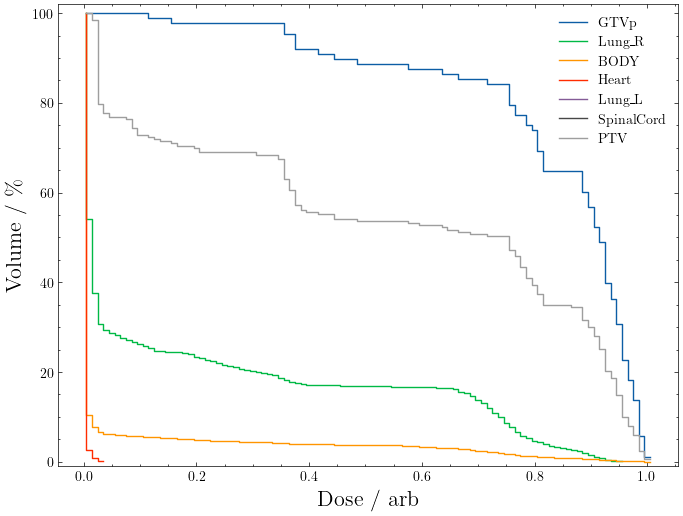

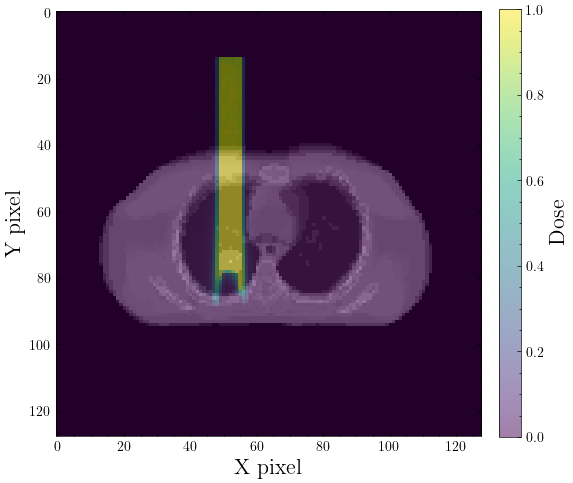

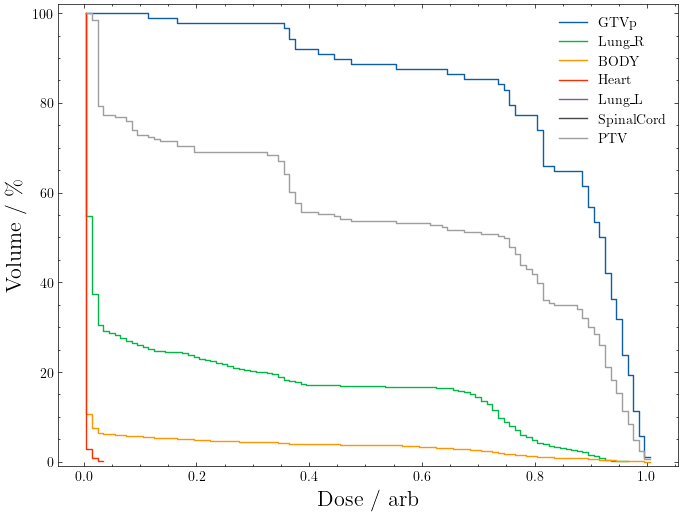

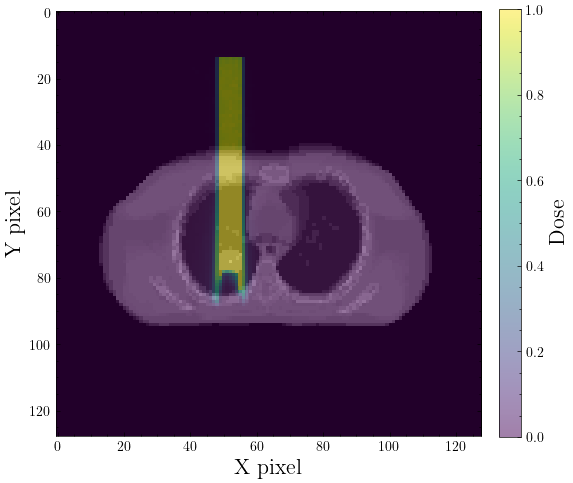

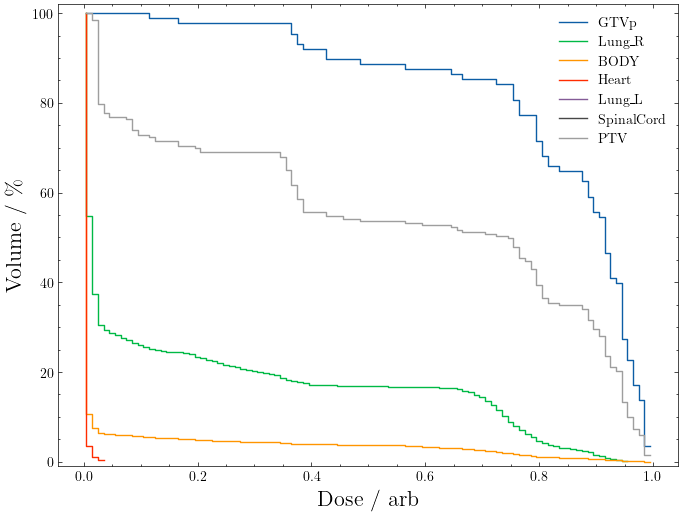

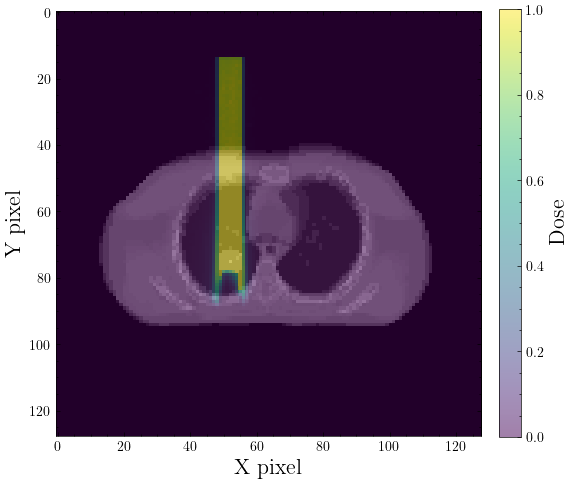

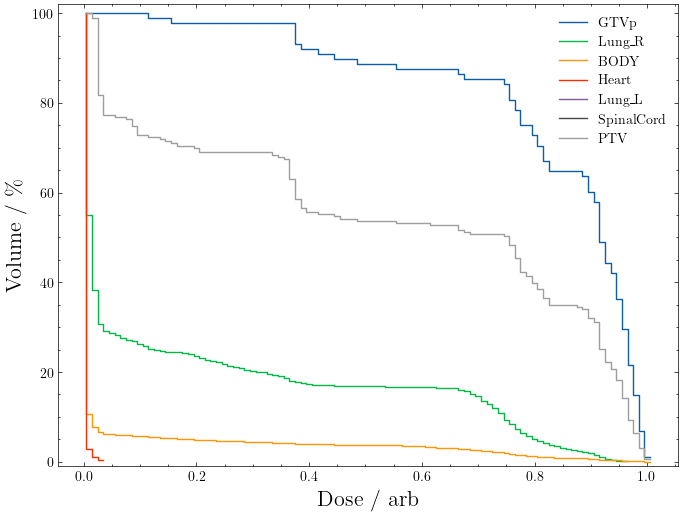

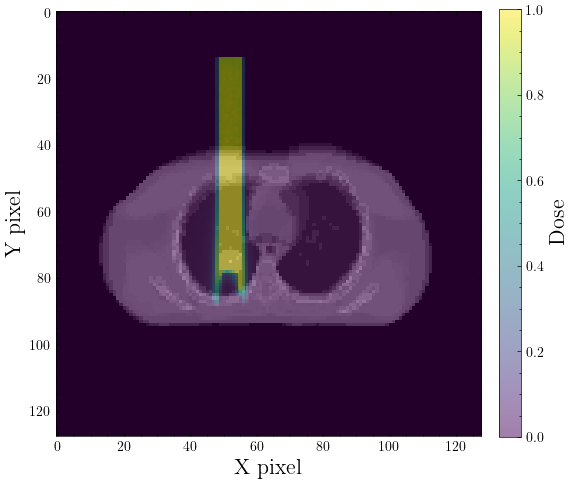

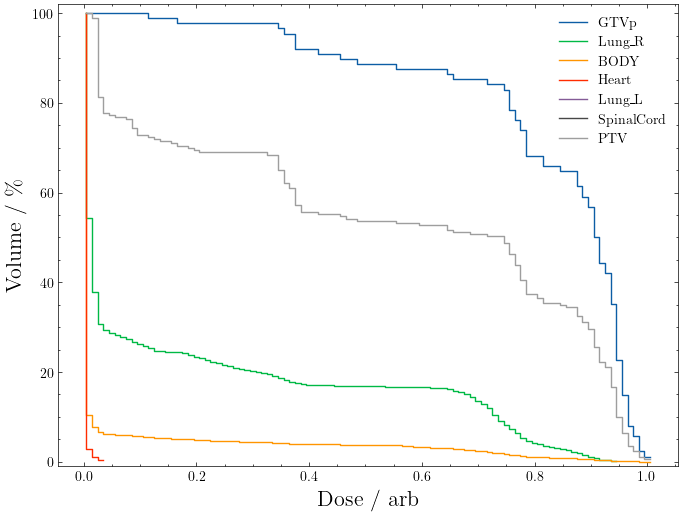

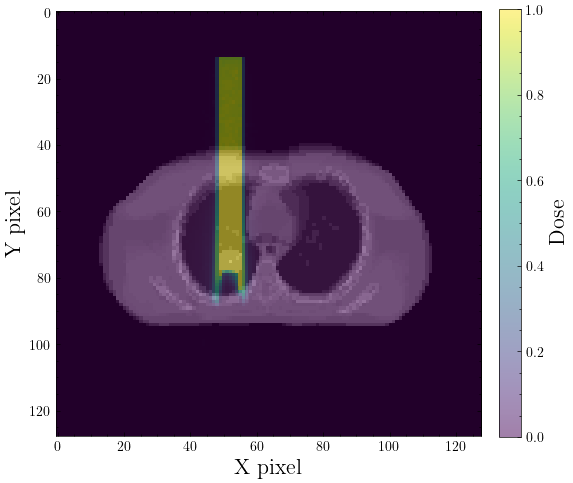

In [11]:
auc = [[] for i in range(0,7)]

bragg_peaks = []
beam_widths = []

for i in range(1,6):
    plt.figure(figsize=(8,6))
    for j in range(1,8):
        dose_grid= dose.DoseGrid(f"./outputs/multi_beam{i}.dcm")
        dose_grid.multiply(1/np.max(dose_grid.dose_grid))
        dose_grid.save_dcm(f"./outputs/multi_beam_{i}_normalised.dcm")
        calcdvh = dvhcalc.get_dvh("../CTData/RTSTruct.dcm", f"./outputs/multi_beam_{i}_normalised.dcm", j)

        auc[j - 1].append(trapezoid(calcdvh.relative_volume.counts, calcdvh.bincenters))
        #print(dose_grid)
        arr = []
        
        plt.step(
            calcdvh.bincenters,
            calcdvh.relative_volume.counts,
            label=structures[j]["name"]
        )
    plt.ylim(-1,102)
    plt.legend()
    plt.ylabel(r"Volume / $\%$", fontsize=16)
    plt.xlabel("Dose / arb", fontsize=16)
    plt.savefig(f"./plots/mb_DVH_{i}.png", dpi=300)
    plt.show()

    arr = []

    for k in range(1,5):
        arr.append(dcmread(f"../CTData/CT{k}.dcm").pixel_array)
    arr = np.sum(arr, axis = 0)

    fig,ax = plt.subplots(1, figsize=(6,6))
    ax.imshow(arr, cmap="gray", alpha=1)
    mesh = ax.pcolormesh([i for i in range(128)], [i for i in range(128)], np.flip(np.flip(np.sum(dose_grid.dose_grid, axis=2).T, axis=0), axis=0), alpha=0.5, vmin=0, vmax=1)
    cbar = fig.colorbar(mesh, fraction=0.046, pad=0.04)
    cbar.set_label("Dose", fontsize=16)
    ax.set_xlabel("X pixel", fontsize=16)
    ax.set_ylabel("Y pixel", fontsize=16)
    # Add axis on the side
    plt.savefig(f"./plots/dose_in_patient_{i}.png", dpi=300)
    plt.show()
    doses = np.sum(np.flip(np.sum(dose_grid.dose_grid, axis=2)).T, axis=1)
    max_pos = np.argmax(doses)
    bragg_peaks.append(max_pos)
    idxs = np.setdiff1d(np.arange(len(doses)), np.where(doses < doses[max_pos]/np.exp(2)))
    beam_widths.append((idxs[-1] - idxs[0]))

In [12]:
for structure_id in structures:
    print(structures[structure_id]["name"], np.mean(auc[structure_id - 1]), np.std(auc[structure_id - 1]))

GTVp 83.28068181818182 0.3932803344786079
Lung_R 16.260513380666293 0.08978922740321163
BODY 3.8778315225479973 0.01872627745146841
Heart 0.5392927308447937 0.004348908373512493
Lung_L 0.0 0.0
SpinalCord 0.0 0.0
PTV 54.4423645320197 0.2746878598870723


In [ ]:
4.37888058e-03, 1.46775430e-04, 1.21608871e-04, 3.37680389e-05,
       7.92358723e-04, 2.93887326e-03, 6.21444901e-04, 1.56949970e-02,
       2.30969647e-02, 1.66787116e-02, 6.16534896e-02, 4.98799626e-02,
       3.73310651e-02, 5.13162422e-02, 6.33604667e-02, 4.22397002e-02,
       3.25281118e-02, 6.15613348e-02, 3.96137507e-02, 7.52238212e-02,
       8.93818971e-02, 4.01983738e-02, 1.00007278e-01, 1.23958074e-01,
       6.00147732e-03, 1.59684185e-01, 1.48650123e-02, 1.40549450e-02,
       1.06023439e-03, 1.00000000e+00, 3.47186659e-01